# DataPrep - préparer ses données en python devient un jeu d'enfant

Le processus de préparation des données commence par trouver les bonnes données. Cela peut provenir d'un catalogue de données existant ou d'un entrepôt. Une fois les données collectées, il est important de découvrir et d'explorer les données à préparer et à traiter. Cette étape est essentielle et permet de connaître les données et de comprendre ce qui doit être fait avant que les données puissent être qualifiées d'utiles dans un contexte particulier.

DataPrep est une bibliothèque open source disponible pour python qui vous permet de préparer vos données à l'aide d'une seule bibliothèque avec seulement quelques lignes de code.
Dans cet article, on vous présentera comment analyser et préparer ses données en quelques lignes

In [ ]:
# installation
#Avec pip 
!pip install dataprep
#Avec anaconda
!conda install -c conda-forge dataprep


## Analyse exploratoire d'un jeu de données avec dataprep

In [1]:
from sklearn.datasets import fetch_california_housing
import random
import numpy as np
from dataprep.eda import plot_correlation ,plot,create_report


NumExpr defaulting to 8 threads.


In [2]:
houses = fetch_california_housing(as_frame=True)


In [3]:
type(houses)

sklearn.utils.Bunch

In [4]:
houses.data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [5]:
print(houses.target)

0        4.526
1        3.585
2        3.521
3        3.413
4        3.422
         ...  
20635    0.781
20636    0.771
20637    0.923
20638    0.847
20639    0.894
Name: MedHouseVal, Length: 20640, dtype: float64


In [6]:
houses.frame.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [7]:
print(houses.DESCR)


.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block
        - HouseAge      median house age in block
        - AveRooms      average number of rooms
        - AveBedrms     average number of bedrooms
        - Population    block population
        - AveOccup      average house occupancy
        - Latitude      house block latitude
        - Longitude     house block longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
http://lib.stat.cmu.edu/datasets/

The target variable is the median house value for California districts.

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bur

In [8]:
houses_df = houses.frame.copy()

In [9]:
houses_df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


Pour la suite nous allons ajouter des mauvaises valeurs de façon aléatoire dans le jeu de données.

In [10]:
print (len(houses_df))

20640


In [11]:
def add_random_bad_values(df,number_of_bad_values = 1000,seed=42):
    dataframe = df.copy()
    bad_values = [ np.NaN, None]
    columns = dataframe.columns.tolist()
    dataframe_size = len(dataframe)
    random.seed(seed)
    for null_values in range(number_of_bad_values):
        random_column = random.choice(columns)
        ranndom_row = random.randint(0,dataframe_size)
        dataframe.loc[ranndom_row,random_column] = random.choice(bad_values)
    return dataframe
        

In [12]:
houses_df = add_random_bad_values(houses_df)

In [13]:
houses_df.isnull().sum()

MedInc          83
HouseAge       142
AveRooms       103
AveBedrms       99
Population     121
AveOccup       124
Latitude       112
Longitude      109
MedHouseVal    100
dtype: int64

In [14]:
from dataprep.eda import plot
import numpy as np

  0%|          | 0/588 [00:00<?, ?it/s]


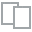
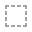
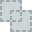
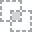
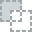
...
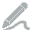
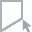
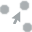
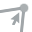
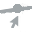

In [15]:
plot(houses_df)

  0%|          | 0/10 [00:00<?, ?it/s]


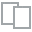
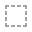
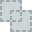
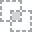
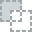
...
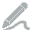
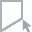
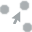
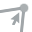
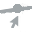

In [16]:
plot(houses_df,"MedInc","MedHouseVal")

  0%|          | 0/6 [00:00<?, ?it/s]


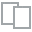
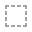
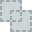
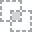
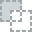
...
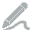
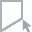
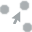
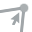
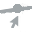

In [17]:
from dataprep.eda.dtypes_v2 import LatLong
latlong = LatLong("Latitude", "Longitude")
plot(houses_df, latlong,"MedHouseVal")


## Analyse de corrélations


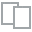
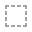
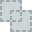
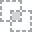
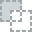
...
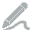
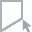
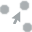
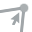
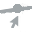

In [18]:
from dataprep.eda import plot_correlation
plot_correlation(houses_df)
#plot_correlation(houses, "MedHouseVal")


  0%|          | 0/203 [00:00<?, ?it/s]


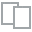
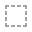
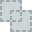
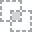
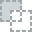
...
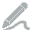
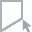
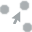
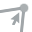
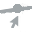

In [19]:
plot_correlation(houses_df, "MedHouseVal")



  0%|          | 0/12 [00:00<?, ?it/s]


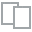
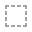
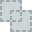
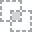
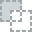
...
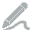
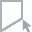
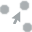
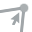
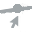

In [20]:
plot_correlation(houses_df, "MedHouseVal" ,"AveRooms")



In [23]:
from dataprep.eda import create_report
report = create_report(houses_df, title='Analyse exploratoire')

  0%|          | 0/1665 [00:00<?, ?it/s]

Analyse exploratoire
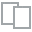
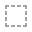
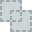
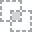
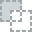
...
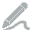
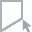
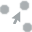
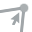
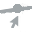

In [24]:
report


In [25]:
report.show_browser()


In [ ]:
report.save(filename='Analyse_exploratoire_01', to='~/Desktop')